In [1]:
#Importing the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

# Set to display all the columns in dataset
pd.set_option("display.max_columns", None)

#Import psql to run queries
import pandasql as psql

In [2]:
#reading the data
ap=pd.read_csv("Application_Data.csv",encoding="latin-1")
ap_bk=ap.copy()
ap.head()

,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status
0,5008806,M,1,1,0,112500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Security staff ...,2,59,4,0,30,1
1,5008808,F,0,1,0,270000,Commercial associate ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,0,1,1,Sales staff ...,1,53,9,0,5,1
2,5008809,F,0,1,0,270000,Commercial associate ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,0,1,1,Sales staff ...,1,53,9,0,5,1
3,5008810,F,0,1,0,270000,Commercial associate ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,0,1,1,Sales staff ...,1,53,9,0,27,1
4,5008811,F,0,1,0,270000,Commercial associate ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,0,1,1,Sales staff ...,1,53,9,0,39,1


In [3]:
ap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25128 entries, 0 to 25127
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Applicant_ID          25128 non-null  int64 
 1   Applicant_Gender      25128 non-null  object
 2   Owned_Car             25128 non-null  int64 
 3   Owned_Realty          25128 non-null  int64 
 4   Total_Children        25128 non-null  int64 
 5   Total_Income          25128 non-null  int64 
 6   Income_Type           25128 non-null  object
 7   Education_Type        25128 non-null  object
 8   Family_Status         25128 non-null  object
 9   Housing_Type          25128 non-null  object
 10  Owned_Mobile_Phone    25128 non-null  int64 
 11  Owned_Work_Phone      25128 non-null  int64 
 12  Owned_Phone           25128 non-null  int64 
 13  Owned_Email           25128 non-null  int64 
 14  Job_Title             25128 non-null  object
 15  Total_Family_Members  25128 non-null

In [4]:
ap.shape

(25128, 21)

In [4]:
#checking null values in data
ap.isnull().sum()

Applicant_ID            0
Applicant_Gender        0
Owned_Car               0
Owned_Realty            0
Total_Children          0
Total_Income            0
Income_Type             0
Education_Type          0
Family_Status           0
Housing_Type            0
Owned_Mobile_Phone      0
Owned_Work_Phone        0
Owned_Phone             0
Owned_Email             0
Job_Title               0
Total_Family_Members    0
Applicant_Age           0
Years_of_Working        0
Total_Bad_Debt          0
Total_Good_Debt         0
Status                  0
dtype: int64

In [5]:
#unqiue values
ap.nunique()

Applicant_ID            25128
Applicant_Gender            2
Owned_Car                   2
Owned_Realty                2
Total_Children              6
Total_Income              195
Income_Type                 5
Education_Type              5
Family_Status               5
Housing_Type                6
Owned_Mobile_Phone          1
Owned_Work_Phone            2
Owned_Phone                 2
Owned_Email                 2
Job_Title                  18
Total_Family_Members        7
Applicant_Age              48
Years_of_Working           43
Total_Bad_Debt             33
Total_Good_Debt            61
Status                      2
dtype: int64

In [6]:
#checking the duplicate values
ap_dup=ap[ap.duplicated(keep='first')]
ap_dup

,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status


In [7]:
#converting required columns into descrete
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
ap['Applicant_Gender']= LE.fit_transform(ap['Applicant_Gender'])
ap['Income_Type']= LE.fit_transform(ap['Income_Type'])
ap['Education_Type']= LE.fit_transform(ap['Education_Type'])
ap['Family_Status']= LE.fit_transform(ap['Family_Status'])
ap['Housing_Type']= LE.fit_transform(ap['Housing_Type'])
ap['Job_Title']= LE.fit_transform(ap['Job_Title'])

In [8]:
ap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25128 entries, 0 to 25127
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Applicant_ID          25128 non-null  int64
 1   Applicant_Gender      25128 non-null  int32
 2   Owned_Car             25128 non-null  int64
 3   Owned_Realty          25128 non-null  int64
 4   Total_Children        25128 non-null  int64
 5   Total_Income          25128 non-null  int64
 6   Income_Type           25128 non-null  int32
 7   Education_Type        25128 non-null  int32
 8   Family_Status         25128 non-null  int32
 9   Housing_Type          25128 non-null  int32
 10  Owned_Mobile_Phone    25128 non-null  int64
 11  Owned_Work_Phone      25128 non-null  int64
 12  Owned_Phone           25128 non-null  int64
 13  Owned_Email           25128 non-null  int64
 14  Job_Title             25128 non-null  int32
 15  Total_Family_Members  25128 non-null  int64
 16  Appl

In [9]:
#printing the value count of each column
for i in ap.columns:
    print(ap[i].value_counts())

5008806    1
5104854    1
5104852    1
5104851    1
5104850    1
          ..
5053251    1
5053249    1
5053248    1
5053247    1
5150487    1
Name: Applicant_ID, Length: 25128, dtype: int64
0    15627
1     9501
Name: Applicant_Gender, dtype: int64
0    14615
1    10513
Name: Owned_Car, dtype: int64
1    16457
0     8671
Name: Owned_Realty, dtype: int64
0    15908
1     6118
2     2715
3      312
4       57
5       18
Name: Total_Children, dtype: int64
135000    3012
180000    2312
157500    2203
225000    2166
112500    1942
          ... 
661500       1
215100       1
124200       1
234135       1
143100       1
Name: Total_Income, Length: 195, dtype: int64
4    15616
0     7052
2     2437
1       13
3       10
Name: Income_Type, dtype: int64
4    16802
1     7132
2      993
3      187
0       14
Name: Education_Type, dtype: int64
1    17507
3     3444
0     2133
2     1464
4      580
Name: Family_Status, dtype: int64
1    22096
5     1430
2      812
4      439
3      199
0      152

In [10]:
# Count the target or dependent variable by '0' & '1' and their proportion
# (>= 10 : 1, then the dataset is imbalance data)

tar = ap.Status.value_counts()
print('Class 0:', tar[0])
print('Class 1:', tar[1])
print('Proportion:', round(tar[1] / tar[0], 2), ': 1')
print('Total records:', len(ap))

Class 0: 121
Class 1: 25007
Proportion: 206.67 : 1
Total records: 25128


In [11]:
del ap['Applicant_ID']

In [12]:
ap.head()

,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status
0,1,1,1,0,112500,4,4,1,1,1,0,0,0,16,2,59,4,0,30,1
1,0,0,1,0,270000,0,4,3,1,1,0,1,1,14,1,53,9,0,5,1
2,0,0,1,0,270000,0,4,3,1,1,0,1,1,14,1,53,9,0,5,1
3,0,0,1,0,270000,0,4,3,1,1,0,1,1,14,1,53,9,0,27,1
4,0,0,1,0,270000,0,4,3,1,1,0,1,1,14,1,53,9,0,39,1


In [13]:
ap.describe()

,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status
count,25128.000000,25128.000000,25128.000000,25128.000000,2.512800e+04,25128.000000,25128.000000,25128.000000,25128.000000,25128.0,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000,25128.000000
mean,0.378104,0.418378,0.654927,0.509472,1.948365e+05,2.681511,3.059814,1.316738,1.322151,1.0,0.273758,0.292741,0.100684,7.704473,2.291309,40.995503,7.690903,0.333095,21.057545,0.995185
std,0.484923,0.493303,0.475402,0.762937,1.045211e+05,1.773412,1.358305,0.893770,1.016895,0.0,0.445895,0.455030,0.300916,4.340208,0.928871,9.552832,6.415007,1.569448,14.735347,0.069227
min,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,1.000000,21.000000,1.000000,0.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.350000e+05,0.000000,1.000000,1.000000,1.000000,1.0,0.000000,0.000000,0.000000,4.000000,2.000000,33.000000,3.000000,0.000000,9.000000,1.000000
50%,0.000000,0.000000,1.000000,0.000000,1.800000e+05,4.000000,4.000000,1.000000,1.000000,1.0,0.000000,0.000000,0.000000,8.000000,2.000000,40.000000,6.000000,0.000000,18.000000,1.000000
75%,1.000000,1.000000,1.000000,1.000000,2.250000e+05,4.000000,4.000000,1.000000,1.000000,1.0,1.000000,1.000000,0.000000,10.000000,3.000000,48.000000,10.000000,0.000000,31.000000,1.000000
max,1.000000,1.000000,1.000000,5.000000,1.575000e+06,4.000000,4.000000,4.000000,5.000000,1.0,1.000000,1.000000,1.000000,17.000000,7.000000,68.000000,44.000000,49.000000,61.000000,1.000000


In [14]:
#finding dependent and independent variables
In=[]
for i in ap.columns:
    if i!='Status':
        In.append(i)
x=ap[In]
y=ap['Status']

In [15]:
# Random oversampling can be implemented using the RandomOverSampler class
from imblearn.over_sampling import RandomOverSampler
oversample = RandomOverSampler(sampling_strategy=0.125)
x_over,y_over = oversample.fit_resample(x,y)
print(x_over.shape)
print(y_over.shape)

(28132, 19)
(28132,)


In [20]:
#spliting the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test= train_test_split(x_over,y_over,test_size=0.3,random_state=42)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((19692, 19), (8440, 19), (19692,), (8440,))

In [21]:
#scaling using minmaxscaling
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))

x_train=scaler.fit_transform(x_train)
x_train=pd.DataFrame(x_train)

x_test=scaler.fit_transform(x_test)
x_test=pd.DataFrame(x_test)

In [22]:
x_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,1.0,0.0,0.0,0.0,0.229651,1.0,0.25,0.25,0.2,0.0,1.0,1.0,0.0,0.823529,0.166667,0.500000,0.186047,0.000000,0.300000
1,1.0,1.0,1.0,0.0,0.127907,1.0,1.00,0.25,0.2,0.0,0.0,0.0,0.0,0.235294,0.166667,0.195652,0.139535,0.000000,0.583333
2,0.0,0.0,1.0,0.0,0.215116,0.0,1.00,0.75,0.2,0.0,0.0,0.0,0.0,0.000000,0.000000,0.630435,0.139535,0.000000,0.216667
3,0.0,0.0,1.0,0.2,0.084302,0.0,1.00,0.25,0.2,0.0,1.0,1.0,0.0,0.470588,0.333333,0.304348,0.232558,0.979592,0.066667
4,1.0,1.0,0.0,0.2,0.127907,0.0,1.00,0.25,0.2,0.0,0.0,0.0,0.0,0.470588,0.333333,0.260870,0.162791,0.000000,0.183333


In [23]:
tar =y_train.value_counts()
print('Proportion:', round(tar[1] / tar[0], 2), ': 1')

Proportion: 7.93 : 1


# Logistic Regression

Confusion matrix : 
 [[7511    9]
 [ 133  787]]
Outcome values : 
 7511 9 133 787
Classification report : 
               precision    recall  f1-score   support

           1       0.98      1.00      0.99      7520
           0       0.99      0.86      0.92       920

    accuracy                           0.98      8440
   macro avg       0.99      0.93      0.95      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.3 %
Precision : 98.3 %
Recall : 99.9 %
F1 Score : 0.991
Specificity or True Negative Rate : 85.5 %
Balanced Accuracy : 92.7 %
MCC : 0.911
roc_auc_score: 0.927


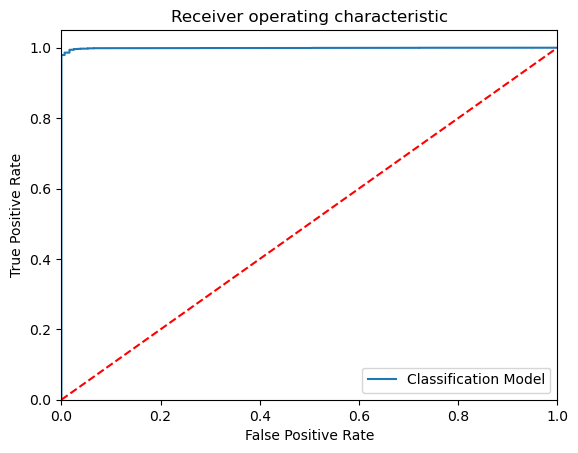

-----------------------------------------------------------------------------------------------------


,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status,Stauts_A,Stauts_P
5473,5037176,F,0,1,1,337500,Commercial associate ...,Higher education ...,Single / not married ...,House / apartment ...,1,0,0,0,Accountants ...,2,40,2,0,14,1,1,1
16620,5100215,M,1,1,0,121500,Commercial associate ...,Higher education ...,Married ...,House / apartment ...,1,0,0,0,Drivers ...,2,40,6,0,9,1,1,1
20782,5125539,M,0,0,0,180000,Working ...,Higher education ...,Married ...,With parents ...,1,1,1,0,High skill tech staff ...,2,37,7,0,29,1,1,1
16038,5096460,M,1,0,0,225000,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Drivers ...,2,28,4,0,21,1,1,1
8161,5052796,M,1,1,0,112500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,1,0,0,Drivers ...,2,35,9,0,21,1,1,1


In [24]:
#logistic regression
from sklearn.linear_model import LogisticRegression
ModelLR=LogisticRegression()
ModelLR.fit(x_train,y_train)
y_pred=ModelLR.predict(x_test)
y_pred_prob=ModelLR.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);

precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelLR.predict_proba(x_test)[:,1])
plt.figure()
#----------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

Results =pd.DataFrame({'Stauts_A':y_test,'Stauts_P':y_pred})
ResultsFinal=ap_bk.merge(Results,left_index=True,right_index=True)
ResultsFinal.sample(5)

# Decision Tree Classification

Confusion matrix : 
 [[7513    7]
 [   0  920]]
Outcome values : 
 7513 7 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.99      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.9 %
Precision : 100.0 %
Recall : 99.9 %
F1 Score : 1.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 0.996
roc_auc_score: 1.0


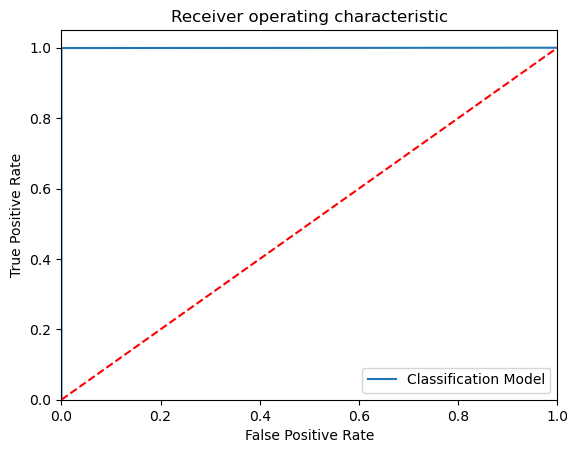

-----------------------------------------------------------------------------------------------------


,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status,Stauts_A,Stauts_P
4093,5028842,M,1,1,1,135000,Commercial associate ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Laborers ...,3,34,2,1,5,1,1,1
17510,5111072,F,1,1,0,373500,Working ...,Secondary / secondary special ...,Widow ...,House / apartment ...,1,0,0,0,Accountants ...,1,57,5,1,37,1,1,1
3366,5025060,M,1,1,0,166500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,High skill tech staff ...,2,33,9,0,17,1,1,1
875,5010396,F,1,1,1,225000,Working ...,Higher education ...,Married ...,House / apartment ...,1,1,1,0,High skill tech staff ...,3,39,5,1,9,1,1,1
21666,5132775,M,0,1,2,135000,Commercial associate ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,1,1,0,Laborers ...,4,34,1,0,35,1,1,1


In [26]:
#decision tree classification
from sklearn.tree import DecisionTreeClassifier
ModelDT= DecisionTreeClassifier()
ModelDT.fit(x_train,y_train)
y_pred=ModelDT.predict(x_test)
y_pred_prob=ModelDT.predict_proba(x_test)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);

precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelDT.predict_proba(x_test)[:,1])
plt.figure()
#----------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
print('-----------------------------------------------------------------------------------------------------')

Results =pd.DataFrame({'Stauts_A':y_test,'Stauts_P':y_pred})
ResultsFinal=ap_bk.merge(Results,left_index=True,right_index=True)
ResultsFinal.sample(5)

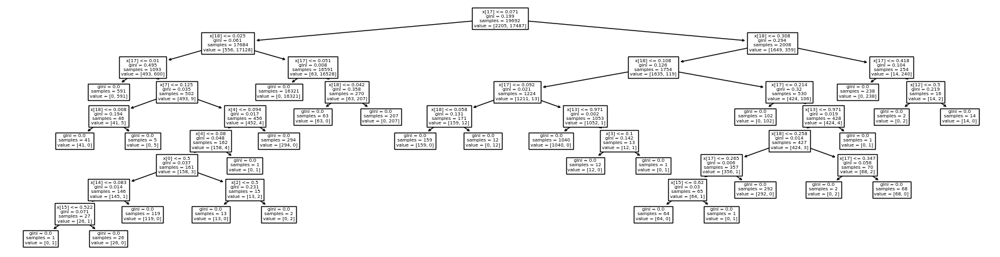

In [27]:
import matplotlib.pyplot as plt
from sklearn import tree
plt.figure(figsize=(20,5))
tree.plot_tree(ModelDT);

# Random Forest Classification

Confusion matrix : 
 [[7520    0]
 [   0  920]]
Outcome values : 
 7520 0 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       1.00      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 1.0
roc_auc_score: 1.0


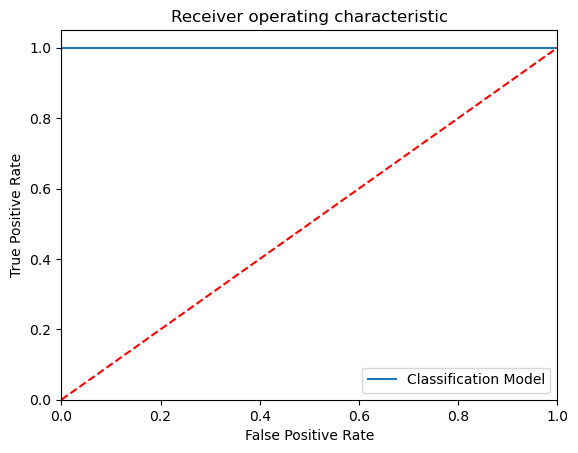

-----------------------------------------------------------------------------------------------------


,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status,Stauts_A,Stauts_P
5971,5041624,M,0,1,0,292500,Commercial associate ...,Higher education ...,Single / not married ...,Rented apartment ...,1,0,1,0,Sales staff ...,1,28,4,0,30,1,1,1
23374,5143046,M,1,0,2,360000,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,1,0,0,Drivers ...,4,44,7,2,31,1,1,1
4026,5028697,M,1,0,1,270000,Working ...,Higher education ...,Married ...,Rented apartment ...,1,0,1,0,Laborers ...,3,30,1,0,25,1,1,1
536,5009739,F,1,0,0,99000,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,1,1,0,Core staff ...,2,41,13,0,17,1,1,1
17116,5105551,F,0,1,0,112500,Working ...,Higher education ...,Married ...,With parents ...,1,0,0,0,Core staff ...,2,26,3,0,26,1,1,1


In [28]:
#Random forest classification
from sklearn.ensemble import RandomForestClassifier
ModelRF= RandomForestClassifier()
ModelRF.fit(x_train,y_train)
y_pred=ModelRF.predict(x_test)
y_pred_prob=ModelRF.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);

precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)


from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelRF.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
print('-----------------------------------------------------------------------------------------------------')

Results =pd.DataFrame({'Stauts_A':y_test,'Stauts_P':y_pred})
ResultsFinal=ap_bk.merge(Results,left_index=True,right_index=True)
ResultsFinal.sample(5)


# KNN Classification

In [29]:
#load the result data set from KNN
KNN_Results= pd.read_csv("KNN_Results.csv", header=0)
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


KNN_K_value =  1
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[7505   15]
 [   0  920]]
Outcome values : 
 7505 15 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.98      1.00      0.99       920

    accuracy                           1.00      8440
   macro avg       0.99      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.8 %
Precision : 100.0 %
Recall : 99.8 %
F1 Score : 0.999
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.9 %
MCC : 0.991
roc_auc_score: 0.999


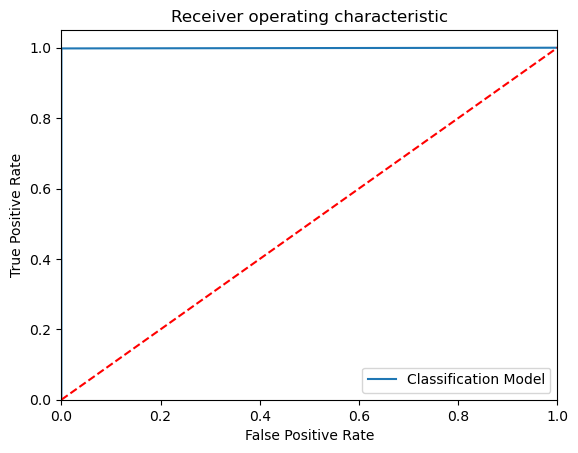

KNN_K_value =  2
Model Name:  KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[7491   29]
 [   0  920]]
Outcome values : 
 7491 29 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.97      1.00      0.98       920

    accuracy                           1.00      8440
   macro avg       0.98      1.00      0.99      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.7 %
Precision : 100.0 %
Recall : 99.6 %
F1 Score : 0.998
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.8 %
MCC : 0.983
roc_auc_score: 0.998


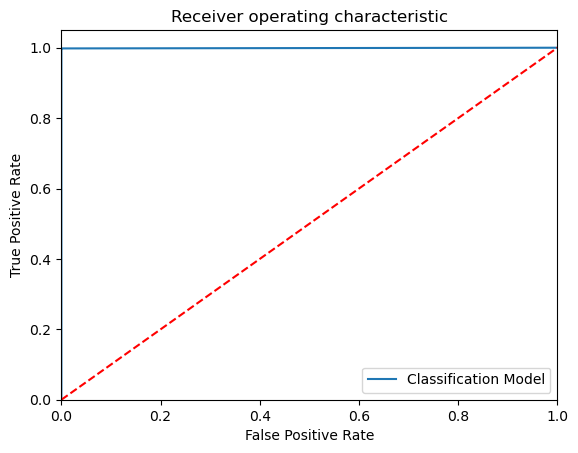

KNN_K_value =  3
Model Name:  KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[7491   29]
 [   0  920]]
Outcome values : 
 7491 29 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.97      1.00      0.98       920

    accuracy                           1.00      8440
   macro avg       0.98      1.00      0.99      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.7 %
Precision : 100.0 %
Recall : 99.6 %
F1 Score : 0.998
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.8 %
MCC : 0.983
roc_auc_score: 0.998


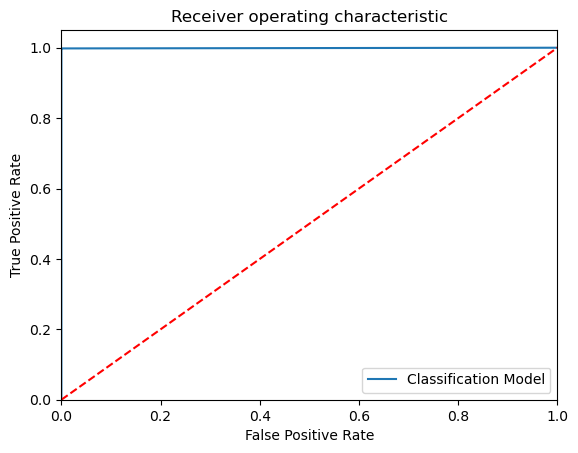

KNN_K_value =  4
Model Name:  KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[7477   43]
 [   0  920]]
Outcome values : 
 7477 43 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      1.00      7520
           0       0.96      1.00      0.98       920

    accuracy                           0.99      8440
   macro avg       0.98      1.00      0.99      8440
weighted avg       1.00      0.99      0.99      8440

Accuracy : 99.5 %
Precision : 100.0 %
Recall : 99.4 %
F1 Score : 0.997
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.7 %
MCC : 0.975
roc_auc_score: 0.997


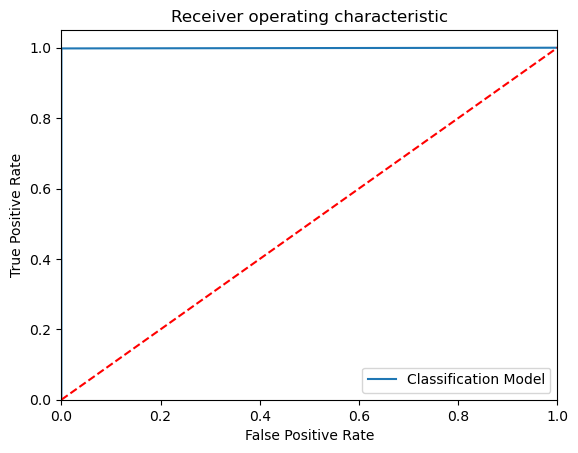

KNN_K_value =  5
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[7477   43]
 [   0  920]]
Outcome values : 
 7477 43 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      1.00      7520
           0       0.96      1.00      0.98       920

    accuracy                           0.99      8440
   macro avg       0.98      1.00      0.99      8440
weighted avg       1.00      0.99      0.99      8440

Accuracy : 99.5 %
Precision : 100.0 %
Recall : 99.4 %
F1 Score : 0.997
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.7 %
MCC : 0.975
roc_auc_score: 0.997


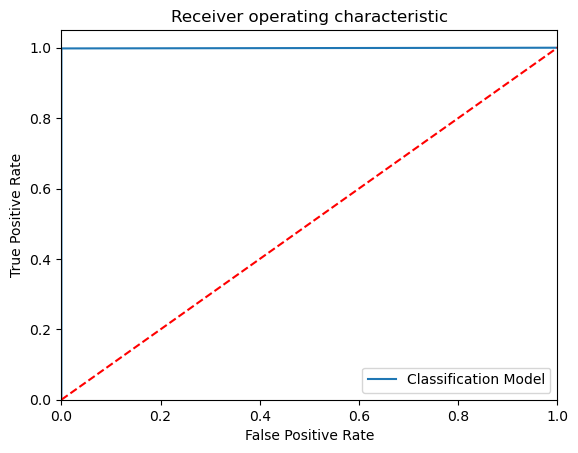

KNN_K_value =  6
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[7463   57]
 [   0  920]]
Outcome values : 
 7463 57 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      1.00      7520
           0       0.94      1.00      0.97       920

    accuracy                           0.99      8440
   macro avg       0.97      1.00      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.3 %
Precision : 100.0 %
Recall : 99.2 %
F1 Score : 0.996
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.6 %
MCC : 0.967
roc_auc_score: 0.996


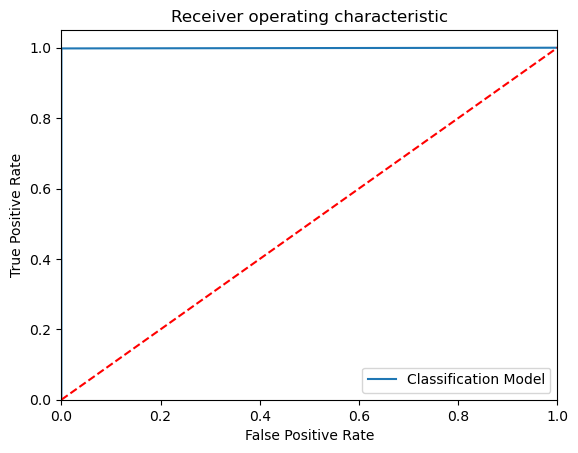

KNN_K_value =  7
Model Name:  KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[7463   57]
 [   0  920]]
Outcome values : 
 7463 57 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      1.00      7520
           0       0.94      1.00      0.97       920

    accuracy                           0.99      8440
   macro avg       0.97      1.00      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.3 %
Precision : 100.0 %
Recall : 99.2 %
F1 Score : 0.996
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.6 %
MCC : 0.967
roc_auc_score: 0.996


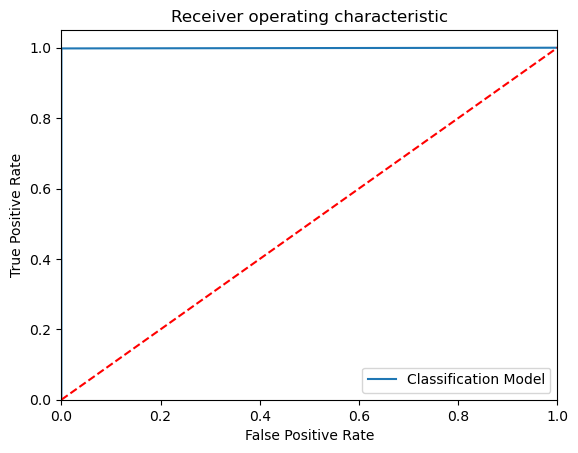

KNN_K_value =  8
Model Name:  KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[7445   75]
 [   0  920]]
Outcome values : 
 7445 75 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      0.99      7520
           0       0.92      1.00      0.96       920

    accuracy                           0.99      8440
   macro avg       0.96      1.00      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.1 %
Precision : 100.0 %
Recall : 99.0 %
F1 Score : 0.995
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.5 %
MCC : 0.957
roc_auc_score: 0.995


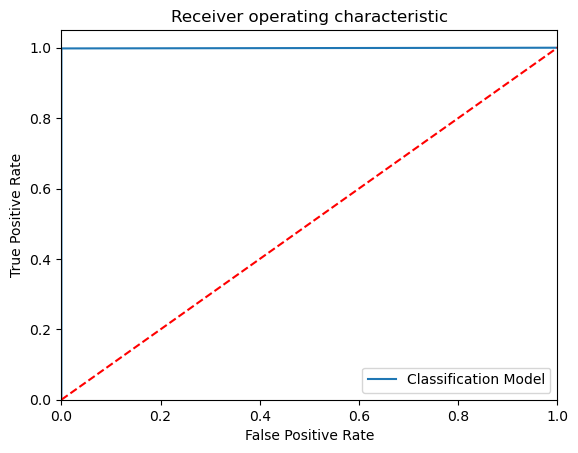

KNN_K_value =  9
Model Name:  KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[7445   75]
 [   0  920]]
Outcome values : 
 7445 75 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      0.99      7520
           0       0.92      1.00      0.96       920

    accuracy                           0.99      8440
   macro avg       0.96      1.00      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.1 %
Precision : 100.0 %
Recall : 99.0 %
F1 Score : 0.995
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.5 %
MCC : 0.957
roc_auc_score: 0.995


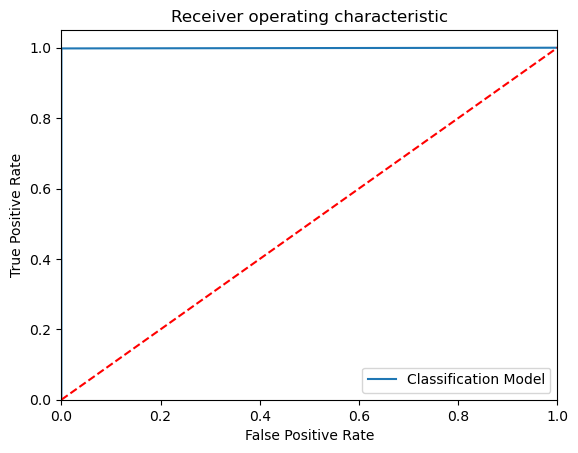

KNN_K_value =  10
Model Name:  KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[7421   99]
 [   0  920]]
Outcome values : 
 7421 99 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      0.99      7520
           0       0.90      1.00      0.95       920

    accuracy                           0.99      8440
   macro avg       0.95      0.99      0.97      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 98.8 %
Precision : 100.0 %
Recall : 98.7 %
F1 Score : 0.993
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.4 %
MCC : 0.944
roc_auc_score: 0.993


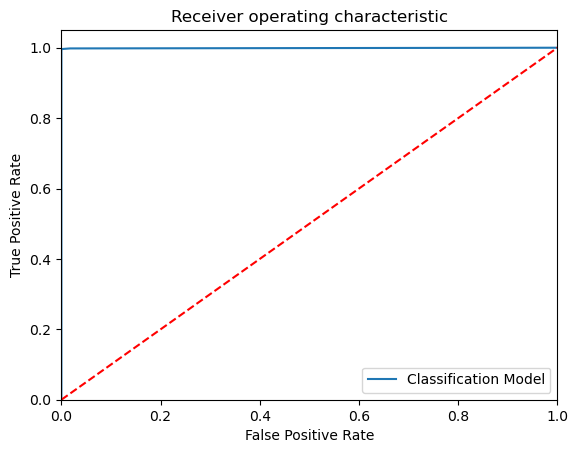

KNN_K_value =  11
Model Name:  KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[7421   99]
 [   0  920]]
Outcome values : 
 7421 99 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      0.99      7520
           0       0.90      1.00      0.95       920

    accuracy                           0.99      8440
   macro avg       0.95      0.99      0.97      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 98.8 %
Precision : 100.0 %
Recall : 98.7 %
F1 Score : 0.993
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.4 %
MCC : 0.944
roc_auc_score: 0.993


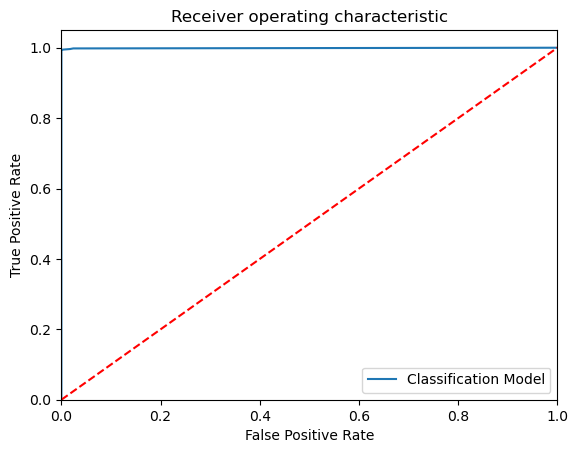

KNN_K_value =  12
Model Name:  KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[7393  127]
 [   0  920]]
Outcome values : 
 7393 127 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.88      1.00      0.94       920

    accuracy                           0.98      8440
   macro avg       0.94      0.99      0.96      8440
weighted avg       0.99      0.98      0.99      8440

Accuracy : 98.5 %
Precision : 100.0 %
Recall : 98.3 %
F1 Score : 0.991
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.2 %
MCC : 0.929
roc_auc_score: 0.992


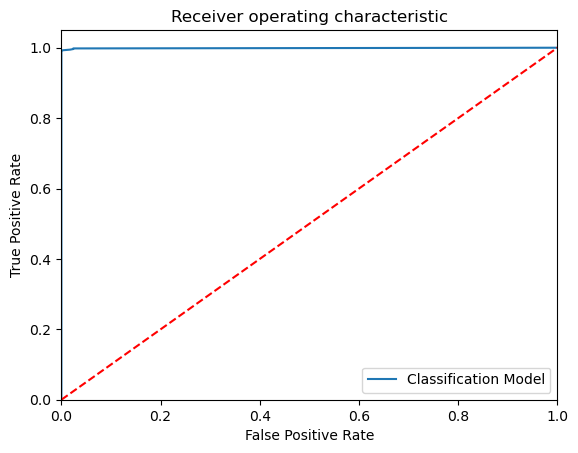

KNN_K_value =  13
Model Name:  KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[7393  127]
 [   0  920]]
Outcome values : 
 7393 127 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.88      1.00      0.94       920

    accuracy                           0.98      8440
   macro avg       0.94      0.99      0.96      8440
weighted avg       0.99      0.98      0.99      8440

Accuracy : 98.5 %
Precision : 100.0 %
Recall : 98.3 %
F1 Score : 0.991
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.2 %
MCC : 0.929
roc_auc_score: 0.992


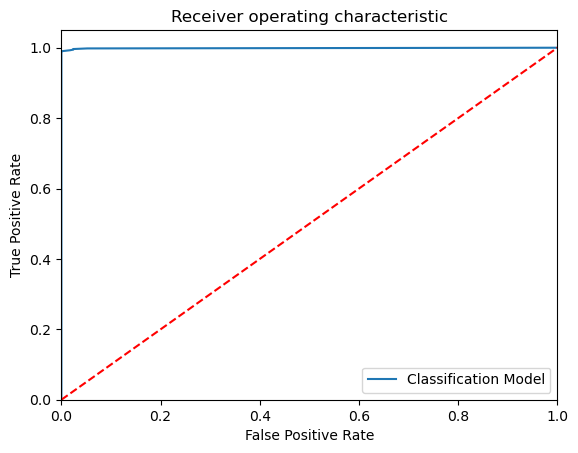

KNN_K_value =  14
Model Name:  KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[7372  148]
 [   0  920]]
Outcome values : 
 7372 148 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.86      1.00      0.93       920

    accuracy                           0.98      8440
   macro avg       0.93      0.99      0.96      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.2 %
Precision : 100.0 %
Recall : 98.0 %
F1 Score : 0.99
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.0 %
MCC : 0.919
roc_auc_score: 0.99


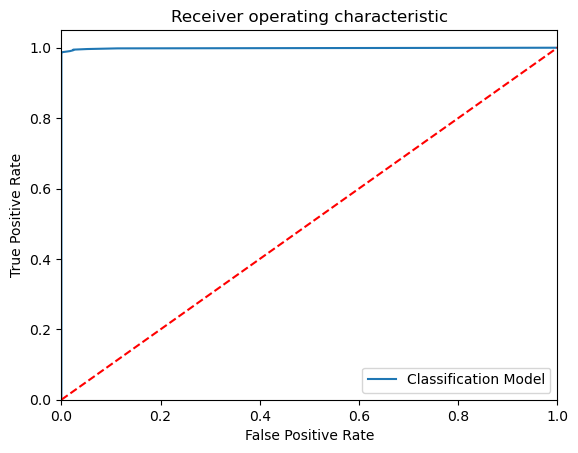

KNN_K_value =  15
Model Name:  KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[7372  148]
 [   0  920]]
Outcome values : 
 7372 148 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.86      1.00      0.93       920

    accuracy                           0.98      8440
   macro avg       0.93      0.99      0.96      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.2 %
Precision : 100.0 %
Recall : 98.0 %
F1 Score : 0.99
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.0 %
MCC : 0.919
roc_auc_score: 0.99


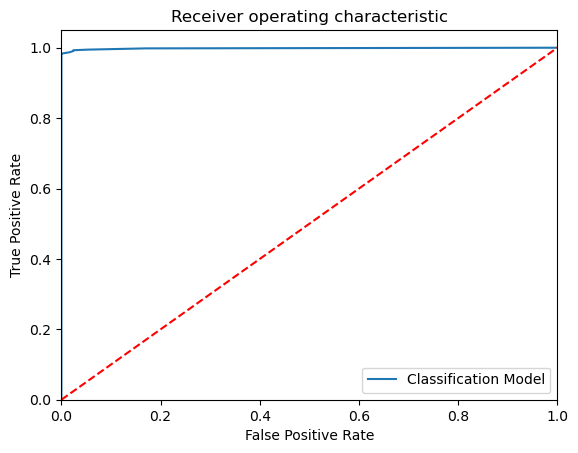

KNN_K_value =  16
Model Name:  KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[7348  172]
 [   0  920]]
Outcome values : 
 7348 172 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.84      1.00      0.91       920

    accuracy                           0.98      8440
   macro avg       0.92      0.99      0.95      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.0 %
Precision : 100.0 %
Recall : 97.7 %
F1 Score : 0.988
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 98.8 %
MCC : 0.907
roc_auc_score: 0.989


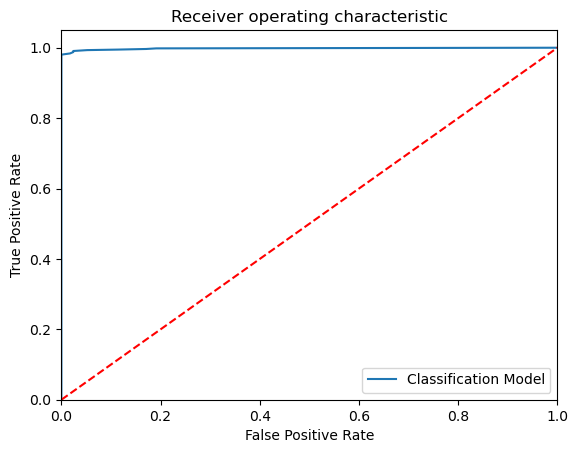

KNN_K_value =  17
Model Name:  KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[7348  172]
 [   0  920]]
Outcome values : 
 7348 172 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.84      1.00      0.91       920

    accuracy                           0.98      8440
   macro avg       0.92      0.99      0.95      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.0 %
Precision : 100.0 %
Recall : 97.7 %
F1 Score : 0.988
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 98.8 %
MCC : 0.907
roc_auc_score: 0.989


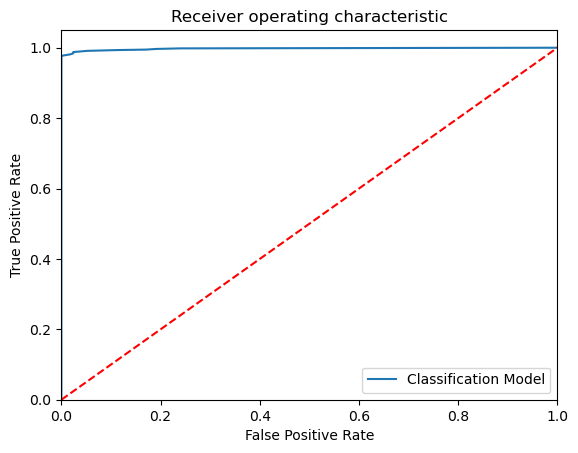

KNN_K_value =  18
Model Name:  KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[7324  196]
 [   0  920]]
Outcome values : 
 7324 196 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.97      0.99      7520
           0       0.82      1.00      0.90       920

    accuracy                           0.98      8440
   macro avg       0.91      0.99      0.95      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 97.7 %
Precision : 100.0 %
Recall : 97.4 %
F1 Score : 0.987
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 98.7 %
MCC : 0.896
roc_auc_score: 0.987


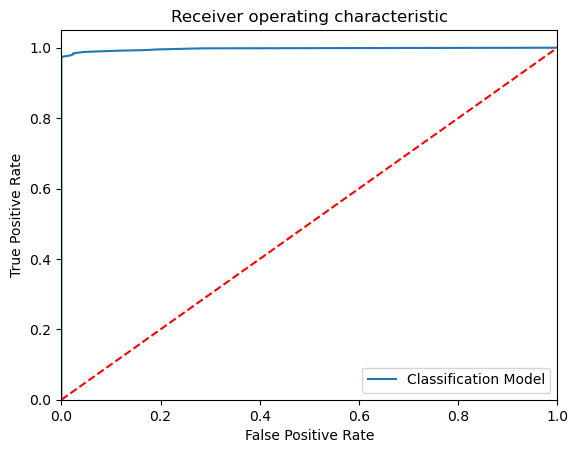

KNN_K_value =  19
Model Name:  KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[7332  188]
 [  16  904]]
Outcome values : 
 7332 188 16 904
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.97      0.99      7520
           0       0.83      0.98      0.90       920

    accuracy                           0.98      8440
   macro avg       0.91      0.98      0.94      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 97.6 %
Precision : 99.8 %
Recall : 97.5 %
F1 Score : 0.986
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 97.9 %
MCC : 0.889
roc_auc_score: 0.979


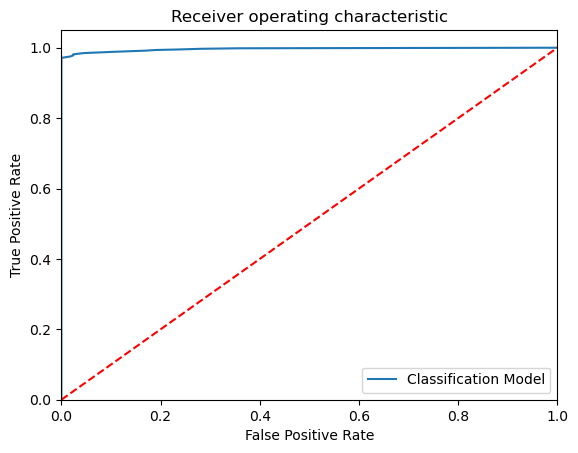

KNN_K_value =  20
Model Name:  KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[7311  209]
 [  16  904]]
Outcome values : 
 7311 209 16 904
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.97      0.98      7520
           0       0.81      0.98      0.89       920

    accuracy                           0.97      8440
   macro avg       0.91      0.98      0.94      8440
weighted avg       0.98      0.97      0.97      8440

Accuracy : 97.3 %
Precision : 99.8 %
Recall : 97.2 %
F1 Score : 0.985
Specificity or True Negative Rate : 98.3 %
Balanced Accuracy : 97.8 %
MCC : 0.879
roc_auc_score: 0.977


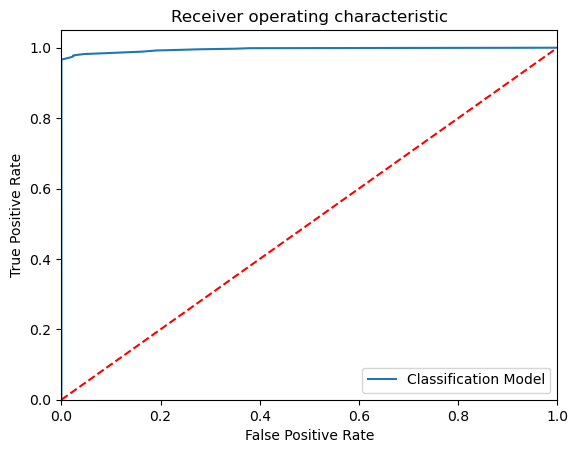

In [30]:
# Build KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):

    k = a

    # Build the model

    ModelKNN = KNeighborsClassifier(n_neighbors=k)

    # Train the model

    ModelKNN.fit(x_train, y_train)

    # Predict the model

    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)

    print('KNN_K_value = ', a)

    # Print the model name

    print('Model Name: ', ModelKNN)

    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);

    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

    # ROC Curve

    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------

In [31]:
KNN_Results.head(20)

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,KNeighborsClassifier(n_neighbors=1),1,7505,15,0,920,0.998,1.000,0.998,0.999,1.000,0.991,0.999003,0.999
1,KNeighborsClassifier(n_neighbors=2),2,7491,29,0,920,0.997,1.000,0.996,0.998,1.000,0.983,0.998072,0.998
2,KNeighborsClassifier(n_neighbors=3),3,7491,29,0,920,0.997,1.000,0.996,0.998,1.000,0.983,0.998072,0.998
3,KNeighborsClassifier(n_neighbors=4),4,7477,43,0,920,0.995,1.000,0.994,0.997,1.000,0.975,0.997141,0.997
4,KNeighborsClassifier(),5,7477,43,0,920,0.995,1.000,0.994,0.997,1.000,0.975,0.997141,0.997
5,KNeighborsClassifier(n_neighbors=6),6,7463,57,0,920,0.993,1.000,0.992,0.996,1.000,0.967,0.996210,0.996
6,KNeighborsClassifier(n_neighbors=7),7,7463,57,0,920,0.993,1.000,0.992,0.996,1.000,0.967,0.996210,0.996
7,KNeighborsClassifier(n_neighbors=8),8,7445,75,0,920,0.991,1.000,0.990,0.995,1.000,0.957,0.995013,0.995
8,KNeighborsClassifier(n_neighbors=9),9,7445,75,0,920,0.991,1.000,0.990,0.995,1.000,0.957,0.995013,0.995
9,KNeighborsClassifier(n_neighbors=10),10,7421,99,0,920,0.988,1.000,0.987,0.993,1.000,0.944,0.993418,0.994


In [26]:
#predict the values with ET algorithm
y_predKNN=ModelKNN.predict(x_test)

In [27]:
#create new dataframe with 'actual' vs 'predict' values
results=pd.DataFrame({'Stauts_A':y_test ,'Stauts_P':y_predKNN})
#merge the datframes on index of both the datframes
resultsfinal=ap_bk.merge(results,left_index=True , right_index=True)
#display 10 records randomly
resultsfinal.sample(10)

,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status,Stauts_A,Stauts_P
16097,5096592,F,0,0,0,202500,Working ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,1,1,0,Core staff ...,1,32,5,0,12,1,1,1
22200,5136933,F,1,0,1,247500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,1,1,0,Managers ...,3,51,7,0,48,1,1,1
13038,5087850,F,1,0,0,202500,State servant ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,1,0,Medicine staff ...,2,54,33,0,9,1,1,1
4585,5029767,F,0,1,0,112500,State servant ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Medicine staff ...,2,59,3,0,36,1,1,1
13483,5089174,F,1,0,1,184500,Working ...,Higher education ...,Separated ...,With parents ...,1,1,0,0,Core staff ...,2,37,13,0,18,1,1,1
2766,5023973,M,1,1,1,270000,Commercial associate ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Drivers ...,3,42,6,0,41,1,1,1
18611,5114424,M,0,0,0,157500,State servant ...,Higher education ...,Married ...,House / apartment ...,1,0,0,0,Core staff ...,2,33,11,0,40,1,1,1
3068,5024525,F,1,1,1,157500,Working ...,Higher education ...,Married ...,House / apartment ...,1,0,0,0,Managers ...,3,41,14,0,12,1,1,1
11401,5068019,M,1,1,0,135000,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Laborers ...,2,43,10,1,7,1,1,1
8786,5054021,F,0,0,0,202500,Working ...,Secondary / secondary special ...,Married ...,Office apartment ...,1,0,0,0,Cleaning staff ...,2,55,6,0,7,1,1,1


# Naive Bayes model (GaussianNB)

Confusion matrix : 
 [[7413  107]
 [ 203  717]]
Outcome values : 
 7413 107 203 717
Classification report : 
               precision    recall  f1-score   support

           1       0.97      0.99      0.98      7520
           0       0.87      0.78      0.82       920

    accuracy                           0.96      8440
   macro avg       0.92      0.88      0.90      8440
weighted avg       0.96      0.96      0.96      8440

Accuracy : 96.3 %
Precision : 97.3 %
Recall : 98.6 %
F1 Score : 0.98
Specificity or True Negative Rate : 77.9 %
Balanced Accuracy : 88.3 %
MCC : 0.803
roc_auc_score: 0.883


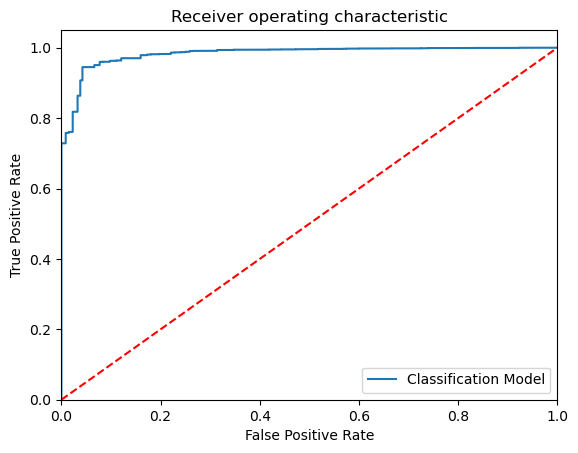

-----------------------------------------------------------------------------------------------------


In [32]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
plt.show()
print('-----------------------------------------------------------------------------------------------------')

# ExtraTrees Classification

Confusion matrix : 
 [[7519    1]
 [   0  920]]
Outcome values : 
 7519 1 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       1.00      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 0.999
roc_auc_score: 1.0


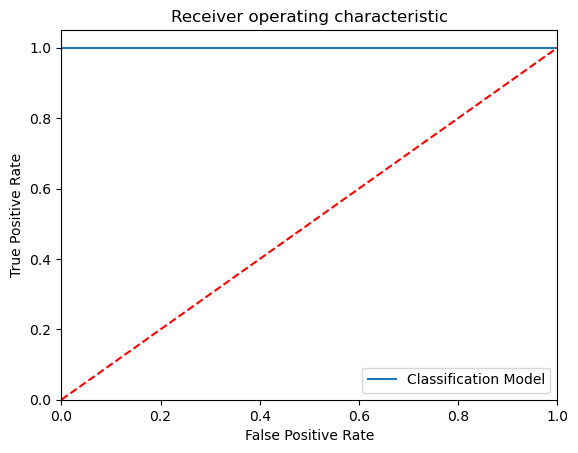

-----------------------------------------------------------------------------------------------------


In [33]:
# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier

ModelET = ExtraTreesClassifier()

# Train the model with train data

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
plt.show()
print('-----------------------------------------------------------------------------------------------------')

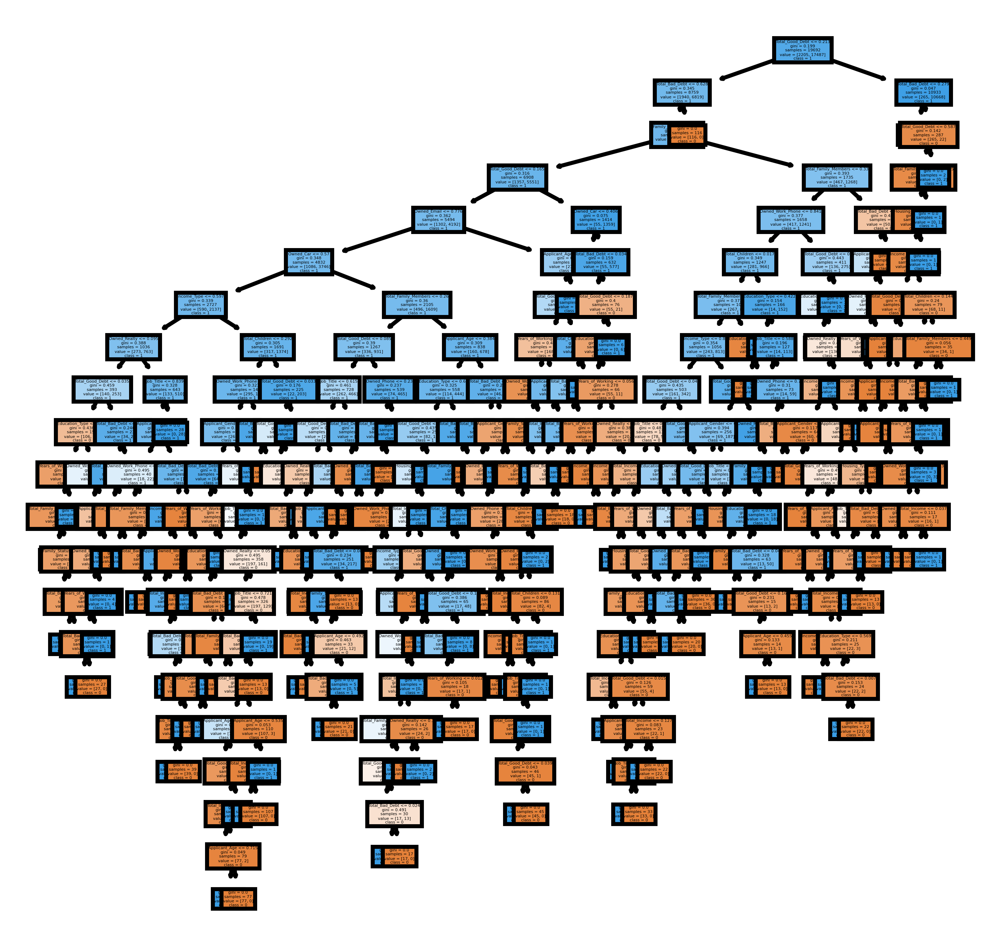

In [34]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=ap.columns
cn1=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1,
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')

In [35]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=ap.columns
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2,
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')

In [36]:
EMResults=pd.read_csv("EMResults.csv",header=0)
EMResults_bk=EMResults.copy()
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


# SVM(rbf) Classification

Model Name:  SVM - rbf
Confusion matrix : 
 [[7456   64]
 [   0  920]]
Outcome values : 
 7456 64 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.99      1.00      7520
           0       0.93      1.00      0.97       920

    accuracy                           0.99      8440
   macro avg       0.97      1.00      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.2 %
Precision : 100.0 %
Recall : 99.1 %
F1 Score : 0.996
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.6 %
MCC : 0.963
roc_auc_score: 0.996


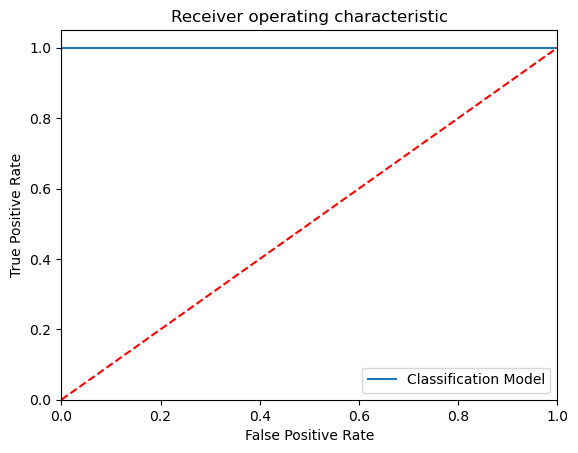

-----------------------------------------------------------------------------------------------------


In [37]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='rbf', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name

print('Model Name: ', "SVM - rbf")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
plt.show()
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian(rbf)",
            'True_Positive' : tp,
            'False_Negative' : fn,
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults= EMResults.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

# SVM(linear) Classification

Model Name:  SVM - linear
Confusion matrix : 
 [[7388  132]
 [   0  920]]
Outcome values : 
 7388 132 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      0.98      0.99      7520
           0       0.87      1.00      0.93       920

    accuracy                           0.98      8440
   macro avg       0.94      0.99      0.96      8440
weighted avg       0.99      0.98      0.98      8440

Accuracy : 98.4 %
Precision : 100.0 %
Recall : 98.2 %
F1 Score : 0.991
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.1 %
MCC : 0.927
roc_auc_score: 0.991


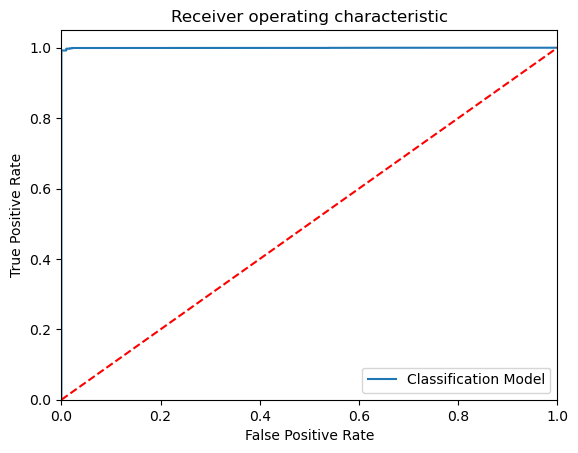

-----------------------------------------------------------------------------------------------------


In [38]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='linear', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name

print('Model Name: ', "SVM - linear")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
plt.show()
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian(linear)",
            'True_Positive' : tp,
            'False_Negative' : fn,
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults= EMResults.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

# SVM(sigmoid) Classification

Model Name:  SVM - sigmoid
Confusion matrix : 
 [[4711 2809]
 [ 357  563]]
Outcome values : 
 4711 2809 357 563
Classification report : 
               precision    recall  f1-score   support

           1       0.93      0.63      0.75      7520
           0       0.17      0.61      0.26       920

    accuracy                           0.62      8440
   macro avg       0.55      0.62      0.51      8440
weighted avg       0.85      0.62      0.70      8440

Accuracy : 62.5 %
Precision : 93.0 %
Recall : 62.6 %
F1 Score : 0.748
Specificity or True Negative Rate : 61.2 %
Balanced Accuracy : 61.9 %
MCC : 0.152
roc_auc_score: 0.619


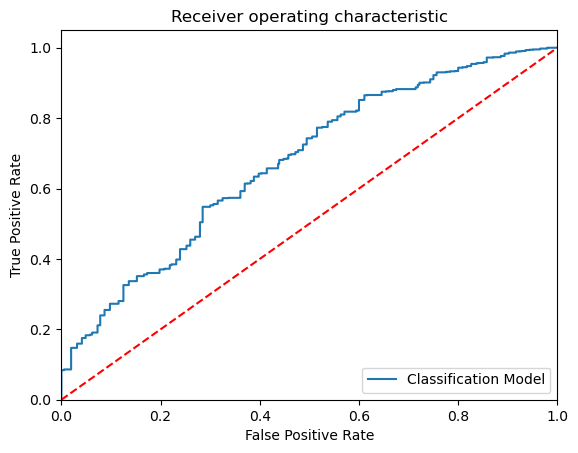

-----------------------------------------------------------------------------------------------------


In [39]:
# Training the SVM algorithm

from sklearn.svm import SVC

ModelSVMGaussian = SVC(kernel='sigmoid', random_state = 42, class_weight='balanced', probability=True)

# Train the model

ModelSVMGaussian.fit(x_train, y_train)

# Predict the model with test data set

y_pred = ModelSVMGaussian.predict(x_test)
y_pred_prob = ModelSVMGaussian.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Print the model name

print('Model Name: ', "SVM - sigmoid")

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = roc_curve(y_test,ModelSVMGaussian.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot
plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
#plt.savefig('Log_ROC')
plt.show()
print('-----------------------------------------------------------------------------------------------------')
#---
new_row = {'Model Name' : "SVM - Gaussian(sigmoid)",
            'True_Positive' : tp,
            'False_Negative' : fn,
            'False_Positive' : fp,
            'True_Negative' : tn,
            'Accuracy' : accuracy,
            'Precision' : precision,
            'Recall' : sensitivity,
            'F1 Score' : f1Score,
            'Specificity' : specificity,
            'MCC':MCC,
            'ROC_AUC_Score':roc_auc_score(actual, predicted),
            'Balanced Accuracy':balanced_accuracy}
EMResults= EMResults.append(new_row, ignore_index=True)
#---------------------------------------------------------------------------------------------------------------

In [40]:
EMResults.head(3)

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,SVM - Gaussian(rbf),7456,64,0,920,0.992,1.00,0.991,0.996,1.000,0.963,0.995745,0.996
1,SVM - Gaussian(linear),7388,132,0,920,0.984,1.00,0.982,0.991,1.000,0.927,0.991223,0.991
2,SVM - Gaussian(sigmoid),4711,2809,357,563,0.625,0.93,0.626,0.748,0.612,0.152,0.619210,0.619


# Comparing all algorithms

Model Name:  LogisticRegression()
Confusion matrix : 
 [[7511    9]
 [ 133  787]]
Outcome values : 
 7511 9 133 787
Classification report : 
               precision    recall  f1-score   support

           1       0.98      1.00      0.99      7520
           0       0.99      0.86      0.92       920

    accuracy                           0.98      8440
   macro avg       0.99      0.93      0.95      8440
weighted avg       0.98      0.98      0.98      8440

Accuracy : 98.3 %
Precision : 98.3 %
Recall : 99.9 %
F1 Score : 0.991
Specificity or True Negative Rate : 85.5 %
Balanced Accuracy : 92.7 %
MCC : 0.911
roc_auc_score: 0.927


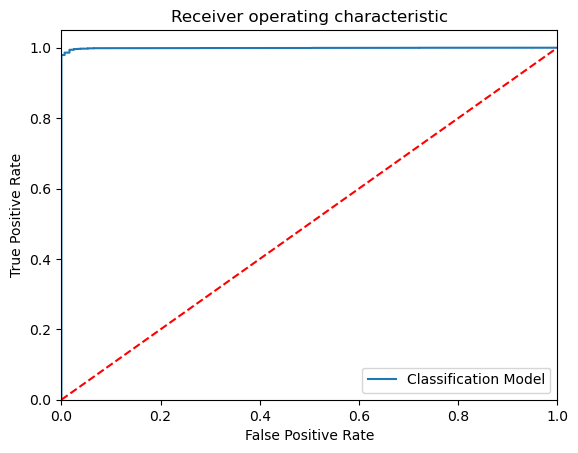

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[7512    8]
 [   0  920]]
Outcome values : 
 7512 8 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.99      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.9 %
Precision : 100.0 %
Recall : 99.9 %
F1 Score : 0.999
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 0.995
roc_auc_score: 0.999


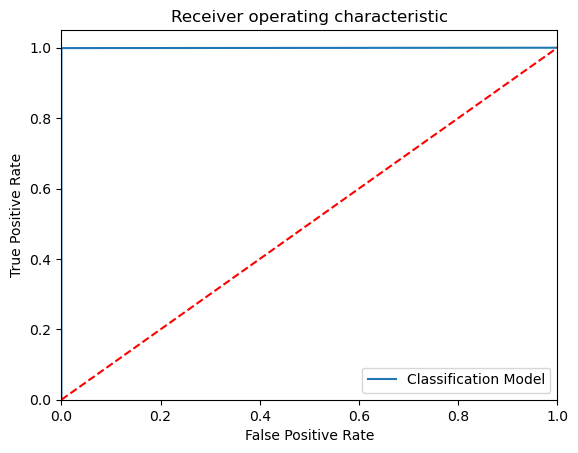

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[7519    1]
 [   0  920]]
Outcome values : 
 7519 1 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       1.00      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 0.999
roc_auc_score: 1.0


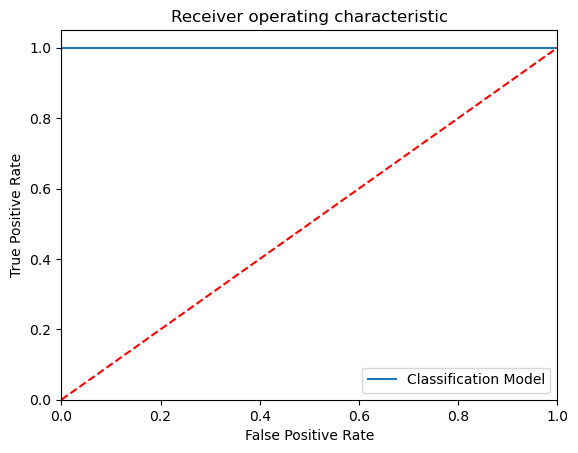

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[7519    1]
 [   0  920]]
Outcome values : 
 7519 1 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       1.00      1.00      1.00       920

    accuracy                           1.00      8440
   macro avg       1.00      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 100.0 %
Precision : 100.0 %
Recall : 100.0 %
F1 Score : 1.0
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 100.0 %
MCC : 0.999
roc_auc_score: 1.0


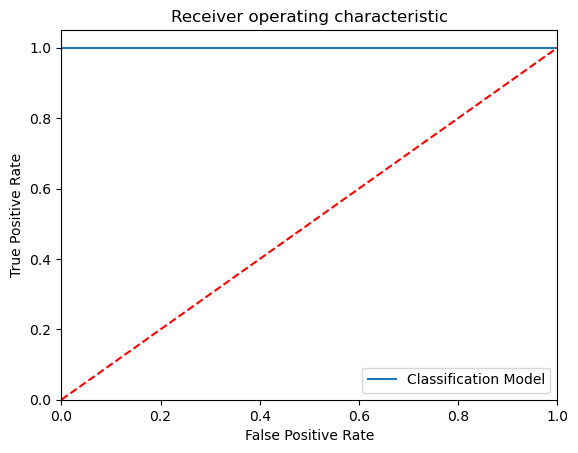

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[7505   15]
 [   0  920]]
Outcome values : 
 7505 15 0 920
Classification report : 
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      7520
           0       0.98      1.00      0.99       920

    accuracy                           1.00      8440
   macro avg       0.99      1.00      1.00      8440
weighted avg       1.00      1.00      1.00      8440

Accuracy : 99.8 %
Precision : 100.0 %
Recall : 99.8 %
F1 Score : 0.999
Specificity or True Negative Rate : 100.0 %
Balanced Accuracy : 99.9 %
MCC : 0.991
roc_auc_score: 0.999


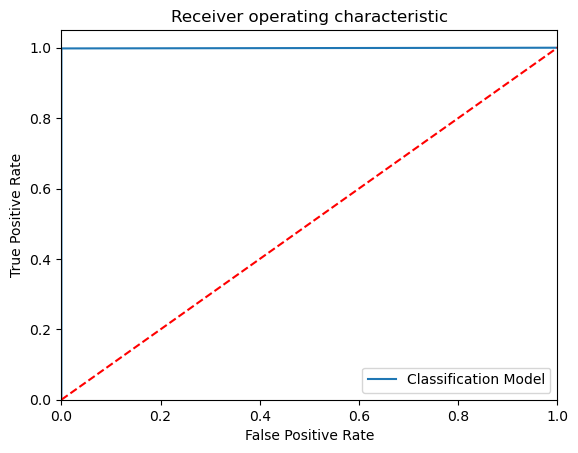

-----------------------------------------------------------------------------------------------------
Model Name:  GaussianNB()
Confusion matrix : 
 [[7413  107]
 [ 203  717]]
Outcome values : 
 7413 107 203 717
Classification report : 
               precision    recall  f1-score   support

           1       0.97      0.99      0.98      7520
           0       0.87      0.78      0.82       920

    accuracy                           0.96      8440
   macro avg       0.92      0.88      0.90      8440
weighted avg       0.96      0.96      0.96      8440

Accuracy : 96.3 %
Precision : 97.3 %
Recall : 98.6 %
F1 Score : 0.98
Specificity or True Negative Rate : 77.9 %
Balanced Accuracy : 88.3 %
MCC : 0.803
roc_auc_score: 0.883


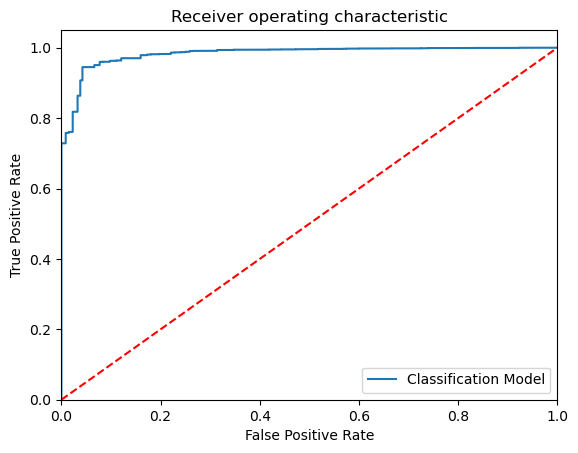

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(probability=True)
Confusion matrix : 
 [[7487   33]
 [  39  881]]
Outcome values : 
 7487 33 39 881
Classification report : 
               precision    recall  f1-score   support

           1       0.99      1.00      1.00      7520
           0       0.96      0.96      0.96       920

    accuracy                           0.99      8440
   macro avg       0.98      0.98      0.98      8440
weighted avg       0.99      0.99      0.99      8440

Accuracy : 99.1 %
Precision : 99.5 %
Recall : 99.6 %
F1 Score : 0.995
Specificity or True Negative Rate : 95.8 %
Balanced Accuracy : 97.7 %
MCC : 0.956
roc_auc_score: 0.977


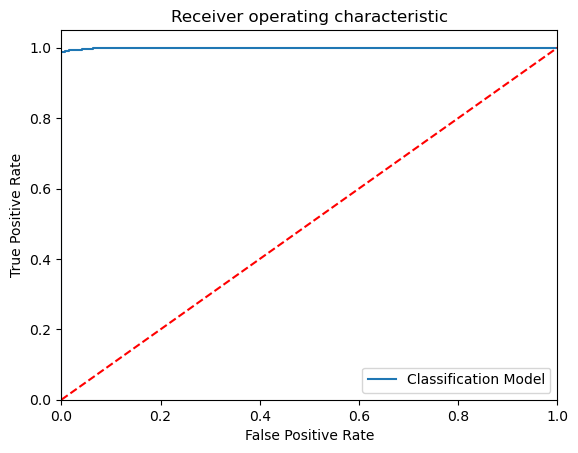

-----------------------------------------------------------------------------------------------------


In [45]:
# Build the Calssification models and compare the results
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

# Create objects of classification algorithms with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=1)
ModelGNB = GaussianNB()
ModelSVM = SVC(probability=True)

# Evalution matrix for all the algorithms

#MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelGNB, ModelSVM]
MM = [ ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelGNB, ModelSVM]
for models in MM:

    # Train the model training dataset
    models.fit(x_train, y_train)

    # Prediction the model with test dataset
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)

    # Print the model name
    print('Model Name: ', models)

    # confusion matrix in sklearn
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values
    actual = y_test

    # predicted values
    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy
    C_Report = classification_report(actual,predicted,labels=[1,0])
    print('Classification report : \n', C_Report)

    # calculating the metrics
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1.
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve
    from sklearn.metrics import roc_curve, roc_auc_score
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

    # ROC Curve
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    Model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    #
    plt.plot(fpr, tpr, label= 'Classification Model' % Model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True_Positive': tp,
               'False_Negative': fn,
               'False_Positive': fp,
               'True_Negative': tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults = EMResults.append(new_row, ignore_index=True)
    #----------------------------------------------------------------------------------------------------------

In [46]:
EMResults.head(10)

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,SVM - Gaussian(rbf),7456,64,0,920,0.992,1.000,0.991,0.996,1.000,0.963,0.995745,0.996
1,SVM - Gaussian(linear),7388,132,0,920,0.984,1.000,0.982,0.991,1.000,0.927,0.991223,0.991
2,SVM - Gaussian(sigmoid),4711,2809,357,563,0.625,0.930,0.626,0.748,0.612,0.152,0.619210,0.619
3,LogisticRegression(),7511,9,133,787,0.983,0.983,0.999,0.991,0.855,0.911,0.927119,0.927
4,DecisionTreeClassifier(),7511,9,0,920,0.999,1.000,0.999,0.999,1.000,0.995,0.999402,1.000
5,"(DecisionTreeClassifier(max_features='sqrt', r...",7520,0,0,920,1.000,1.000,1.000,1.000,1.000,1.000,1.000000,1.000
6,"(ExtraTreeClassifier(random_state=1602047783),...",7519,1,0,920,1.000,1.000,1.000,1.000,1.000,0.999,0.999934,1.000
7,KNeighborsClassifier(n_neighbors=6),7463,57,0,920,0.993,1.000,0.992,0.996,1.000,0.967,0.996210,0.996
8,GaussianNB(),7413,107,203,717,0.963,0.973,0.986,0.980,0.779,0.803,0.882560,0.883
9,SVC(probability=True),7487,33,39,881,0.991,0.995,0.996,0.995,0.958,0.956,0.976610,0.977


In [47]:
y_pred=ModelRF.predict(x_test)
y_pred_prob=ModelRF.predict_proba(x_test)

In [48]:
Results=pd.DataFrame({'Status_A':y_test,'Status_P':y_pred})
ResultsFinal=ap_bk.merge(Results,left_index=True,right_index=True)
# Calculate the %of Error
ResultsFinal.sample(5)

,Applicant_ID,Applicant_Gender,Owned_Car,Owned_Realty,Total_Children,Total_Income,Income_Type,Education_Type,Family_Status,Housing_Type,Owned_Mobile_Phone,Owned_Work_Phone,Owned_Phone,Owned_Email,Job_Title,Total_Family_Members,Applicant_Age,Years_of_Working,Total_Bad_Debt,Total_Good_Debt,Status,Status_A,Status_P
21950,5135642,F,0,1,1,112500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,0,Laborers ...,3,42,1,0,16,1,1,1
22679,5139878,F,1,1,0,720000,Commercial associate ...,Higher education ...,Separated ...,House / apartment ...,1,1,1,0,Managers ...,1,57,14,0,31,1,1,1
11491,5068175,F,1,1,2,112500,Working ...,Secondary / secondary special ...,Married ...,House / apartment ...,1,0,0,1,Sales staff ...,4,37,7,0,46,1,1,1
741,5010099,F,1,1,2,306000,State servant ...,Higher education ...,Married ...,House / apartment ...,1,0,0,0,Core staff ...,4,38,11,0,43,1,1,1
17093,5105494,M,1,1,0,202500,Commercial associate ...,Secondary / secondary special ...,Single / not married ...,House / apartment ...,1,0,0,0,Waiters/barmen staff ...,1,26,4,0,22,1,1,1
